# Hito 1

**Minería de Datos**

*CC5205-1 - Otoño 2022*

Integrantes:
- Felipe Urrutia
- Camilo Carvajal
- Gianluca Musso
- Jose Ignacio Saffie
- Matias Lopez Roman

## Introducción

Durante los últimos años hemos vivido un aumento considerable tanto en la cantidad y acceso a grandes cantidades de datos, como también a un poder de cálculo que ha proliferado las posibilidades para procesar estos.
En este contexto, el procesamiento de lenguaje natural ha adquirido un rol protagónico. A los métodos estadísticos y probabilísticos se le ha agregado modelos de lenguaje con impresionantes capacidades para procesar, clasificar en incluso generar texto. 

Una de sus tareas más populares ha sido el análisis de sentimiento, que trata de predecir el valor emocional de algún documento. Esta es una tarea difícil incluso para seres humanos, pero muy útil puesto a que sus aplicaciones son variadas. Por ejemplo, es de interés para  una empresa saber el sentimiento de los clientes hacia sus productos. Esto se puede lograr procesando grandes cantidades de tweets o de reseñas. 
En su versión más explorada, el análisis de sentimiento trata de predecir cuan positivo o negativo es un mensaje, sin embargo este proceso puede ser refinado aún más. La complejidad del lenguaje humano nos sugiere que podemos considerar modelar el valor sentimental de un mensaje en un muchas más dimensiones.

El dataset **Multilingual Emoji Prediction** (Barbieri et al. 2010, descargable [con este link](https://github.com/fvancesco/Semeval2018-Task2-Emoji-Detection/blob/master/dataset/Semeval2018-Task2-EmojiPrediction.zip?raw=true)) contiene alrededor de 500k tweets, todos conteniendo un emoji, de un conjunto de 20 comúnmente usados. El desafío de base es predecir el emoji en cuestión desde el texto del tweet. Esta tarea puede ser interpretada como una de análisis de sentimiento multimodal puesto a que el emoji comúnmente denota información no verbal del mensaje o contexto, muchas veces emocional.

Barbieri, F., Camacho-Collados, J., Ronzano, F., Espinosa Anke, L., Ballesteros, M., Basile, V., ... & Saggion, H. (2018). Semeval 2018 task 2: Multilingual emoji prediction. In 12th International Workshop on Semantic Evaluation (SemEval 2018) (pp. 24-33). Association for Computational Linguistics. [http://dx.doi.org/10.18653/v1/S18-1003](http://dx.doi.org/10.18653/v1/S18-1003)

**Librerias**

In [1]:
import pandas as pd
import numpy as np
import pickle
from string import punctuation
 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
plt.rc('axes', titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rcParams.update({'font.size': 16})
plt.rcParams['axes.titlesize'] = 16
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams.update({'lines.markeredgewidth': 1})
plt.rcParams.update({'errorbar.capsize': 2})
import plotly.express as px

**Rutas**

```
Data
|-mapping
|--df_es_mapping.pickle
|--df_us_mapping.pickle
|--es_mapping.txt
|--us_mapping.txt
|-test
|--df_es_test.pickle
|--df_us_test.pickle
|--es_test.labels
|--es_test.text
|--us_test.labels
|--us_test.text
|-trial
|--df_es_trial.pickle
|--df_us_trial.pickle
|--es_trial.labels
|--es_trial.text
|--us_trial.labels
|--us_trial.text
|--[train]
|--df_es_train.pickle
|--df_us_train.pickle
```

In [2]:
file_names = {
    "df_es_mapping": "../../Data/mapping/df_es_mapping.pickle",
    "df_us_mapping": "../../Data/mapping/df_us_mapping.pickle",
    
    "df_es_test": "../../Data/test/df_es_test.pickle",
    "df_us_test": "../../Data/test/df_us_test.pickle",
    
    "df_es_train": "../../Data/train/df_es_train.pickle",
    "df_us_train": "../../Data/train/df_us_train.pickle",
    
    "df_es_trial": "../../Data/trial/df_es_trial.pickle",
    "df_us_trial": "../../Data/trial/df_us_trial.pickle",
}

**Cargar sets**

In [3]:
df_es_train = pickle.load(open(file_names["df_es_train"], "rb"))
df_es_trial = pickle.load(open(file_names["df_es_trial"], "rb"))
df_es_test = pickle.load(open(file_names["df_es_test"], "rb"))

df_us_train = pickle.load(open(file_names["df_us_train"], "rb"))
df_us_trial = pickle.load(open(file_names["df_us_trial"], "rb"))
df_us_test = pickle.load(open(file_names["df_us_test"], "rb"))

## Exploración de datos

Lorem ipsum dolor sit amet, consectetur adipiscing elit. Nunc suscipit vitae enim vitae blandit. Duis auctor facilisis lorem vitae pulvinar. Nullam sollicitudin ac sem vel lobortis. Ut porta, dolor vitae sollicitudin sollicitudin, turpis sem ultricies nisi, ac tristique nisi tortor non justo. Morbi euismod nisi eu pellentesque feugiat. Proin vulputate sed purus non aliquam. Curabitur non laoreet nibh, et vehicula tellus. Aliquam eu molestie sem, quis elementum tortor. Maecenas sit amet dictum elit, sit amet facilisis lacus. Sed rhoncus elit at sem placerat iaculis. Maecenas fermentum eros at orci maximus, ut efficitur dolor vestibulum. Lorem ipsum dolor sit amet, consectetur adipiscing elit.

Quisque quis dolor ut neque placerat facilisis nec ut est. Ut blandit cursus iaculis. Sed accumsan et neque sit amet cursus. Quisque velit ligula, viverra nec commodo at, lobortis et diam. Orci varius natoque penatibus et magnis dis parturient montes, nascetur ridiculus mus. Aliquam aliquet mattis dolor vitae ultrices. Donec eu vulputate sapien, ac egestas mauris.

**Español**

In [4]:
df_es_mapping = pickle.load(open(file_names["df_es_mapping"], "rb"))
df_es_mapping

,label,emoji,name
0,0,❤,_red_heart_
1,1,😍,_smiling_face_with_hearteyes_
2,2,😂,_face_with_tears_of_joy_
3,3,💕,_two_hearts_
4,4,😊,_smiling_face_with_smiling_eyes_
5,5,😘,_face_blowing_a_kiss_
6,6,💪,_flexed_biceps_
7,7,😉,_winking_face_
8,8,👌,_OK_hand_
9,9,🇪🇸,_Spain_


**Inglés**

In [71]:
df_us_mapping = pickle.load(open(file_names["df_us_mapping"], "rb"))
df_us_mapping

,label,emoji,name
0,0,❤,_red_heart_
1,1,😍,_smiling_face_with_hearteyes_
2,2,😂,_face_with_tears_of_joy_
3,3,💕,_two_hearts_
4,4,🔥,_fire_
5,5,😊,_smiling_face_with_smiling_eyes_
6,6,😎,_smiling_face_with_sunglasses_
7,7,✨,_sparkles_
8,8,💙,_blue_heart_
9,9,😘,_face_blowing_a_kiss_


### Frecuencia de emojis

Analizar frecuencia de emojis para el dataset/train

Cargamos el train set en español.

In [86]:
frecuencias1 = df_es_train.merge(df_es_mapping, how="right", on="label")["emoji"].value_counts().to_frame()
frecuencias1 = frecuencias1.reset_index().rename(columns={"emoji": "freq.", "index": "emoji"})
frecuencias2 = frecuencias1.merge(df_es_mapping,how='right', on='emoji')
frecuencias2

,emoji,freq.,label,name
0,❤,16102,0,_red_heart_
1,😍,11429,1,_smiling_face_with_hearteyes_
2,😂,7725,2,_face_with_tears_of_joy_
3,💕,5348,3,_two_hearts_
4,😊,5448,4,_smiling_face_with_smiling_eyes_
5,😘,3660,5,_face_blowing_a_kiss_
6,💪,3124,6,_flexed_biceps_
7,😉,3117,7,_winking_face_
8,👌,2884,8,_OK_hand_
9,🇪🇸,2757,9,_Spain_


In [87]:
fig_es = px.histogram(frecuencias2, x="emoji", y = "freq.")
fig_es.show()

<AxesSubplot:>

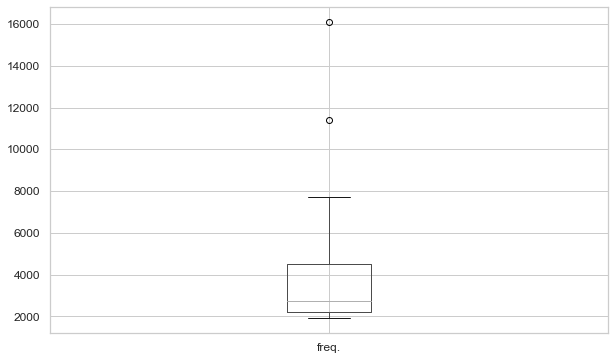

In [88]:
frecuencias2.boxplot(column = "freq.")

In [89]:
def contar(df):
    # retorna diccionario id_eomji : frecuencia
    return df['emoji'].value_counts().to_dict()

# contar(df_es_train.merge(df_es_mapping, how="right", on="label"))  # ejemplo de uso

def tendencia_freq_emojis(df,verbose=True):
    conteo = contar(df)
    mean = np.mean(list(conteo.values()))
    std = np.std(list(conteo.values()))
    conteo_norm = {k:(v-mean)/std for k, v in conteo.items()}
    if verbose:
        print("media: {}".format(mean))
        print("desviación estándar: {}".format(std))
    return mean, std, conteo_norm

mean, std, conteo_norm = tendencia_freq_emojis(df_es_train.merge(df_es_mapping, how="right", on="label"))

conteo_norm

media: 4280.315789473684
desviación estándar: 3643.0362994656502


{'❤': 3.2450086243335776,
 '😍': 1.962287395153011,
 '😂': 0.9455530846704909,
 '😊': 0.32052500017570185,
 '💕': 0.29307536976310683,
 '😘': -0.17027439160149743,
 '💪': -0.31740441061300684,
 '😉': -0.3193258847418885,
 '👌': -0.3832835236032349,
 '🇪🇸': -0.4181445542272306,
 '😎': -0.45849551093374535,
 '💙': -0.5279430758776108,
 '😜': -0.5466088245581754,
 '💜': -0.5680195362799996,
 '😁': -0.5702155067130071,
 '🎶': -0.5951946703884686,
 '💞': -0.6146839079814111,
 '✨': -0.6242912786258193,
 '💘': -0.6525643979507922}

In [90]:
# todos los sets
mean_es_test, std_es_test, conteo_norm_es_test = tendencia_freq_emojis(df_es_test.merge(df_es_mapping, how="right", on="label"),verbose=False)
mean_es_trial, std_es_trial, conteo_norm_es_trial = tendencia_freq_emojis(df_es_trial.merge(df_es_mapping, how="right", on="label"),verbose=False)

In [91]:
print('Dataset en Español')
print("%25s" % "Train", "%15s" % "Test", "%15s" % "Trial")
print('=================================================================================')
print('Media '+"%18s" %"%.1f" % mean, "%13s" % "%.1f" % mean_es_test, "%15s" % "%.1f" % mean_es_trial)
print('Desviación std. '+"%8s" %"%.1f" % std, "%13s" % "%.1f" % std_es_test, "%15s" % "%.1f" % std_es_trial)

Dataset en Español
                    Train            Test           Trial
Media               4280.3          526.3            526.3
Desviación std.     3643.0          528.7            454.0


In [92]:
# mostrar dataframe emojis vs frecuencia y frecuencia normalizada
estudio_freq = frecuencias2.copy()
estudio_freq = estudio_freq.set_index('label')
estudio_freq = estudio_freq.rename(columns={'freq.':'freq. train'})
estudio_freq['freq. norm. train'] = conteo_norm.values()
estudio_freq['freq. test'] = contar(df_es_test.merge(df_es_mapping, how="right", on="label")).values()
estudio_freq['freq. norm. test'] = conteo_norm_es_test.values()
estudio_freq['freq. trial'] = contar(df_es_trial.merge(df_es_mapping, how="right", on="label")).values()
estudio_freq['freq. norm. trial'] = conteo_norm_es_trial.values()
estudio_freq

,emoji,freq. train,name,freq. norm. train,freq. test,freq. norm. test,freq. trial,freq. norm. trial
label,,,,,,,,
0,❤,16102,_red_heart_,3.245009,2141,3.053876,2028,3.307641
1,😍,11429,_smiling_face_with_hearteyes_,1.962287,1499,1.839652,1363,1.842898
2,😂,7725,_face_with_tears_of_joy_,0.945553,1408,1.667542,970,0.977268
3,💕,5348,_two_hearts_,0.320525,514,-0.023293,705,0.393574
4,😊,5448,_smiling_face_with_smiling_eyes_,0.293075,453,-0.138663,645,0.261416
5,😘,3660,_face_blowing_a_kiss_,-0.170274,424,-0.193511,415,-0.245186
6,💪,3124,_flexed_biceps_,-0.317404,416,-0.208642,386,-0.309062
7,😉,3117,_winking_face_,-0.319326,413,-0.214316,369,-0.346507
8,👌,2884,_OK_hand_,-0.383284,397,-0.244577,367,-0.350912


In [93]:
fig_es = px.histogram(estudio_freq, x="emoji", y =['freq. train','freq. test','freq. trial'])
fig_es.show()

In [94]:
# barmode="group"
fig_es = px.histogram(estudio_freq, x="emoji", y =['freq. norm. train','freq. norm. test','freq. norm. trial'], barmode="group")
fig_es.show()

Ahora realizaremos el mismo estudio para el dataset en inglés

In [95]:
mean_en_train, std_en_train, conteo_norm_en_train = tendencia_freq_emojis(df_us_train.merge(df_us_mapping, how="right", on="label"),verbose=False)
mean_en_trial, std_en_trial, conteo_norm_en_trial = tendencia_freq_emojis(df_us_trial.merge(df_us_mapping, how="right", on="label"),verbose=False)
mean_en_test, std_en_test, conteo_norm_en_test = tendencia_freq_emojis(df_us_test.merge(df_us_mapping, how="right", on="label"),verbose=False)

In [96]:
print('Dataset en Inglés')
print("%25s" % "Train", "%15s" % "Test", "%15s" % "Trial")
print('=================================================================================')
print('Media '+"%18s" %"%.1f" % mean_en_train, "%13s" % "%.1f" % mean_en_test, "%15s" % "%.1f" % mean_en_trial)
print('Desviación std. '+"%8s" %"%.1f" % std_en_train, "%13s" % "%.1f" % std_en_test, "%15s" % "%.1f" % std_en_trial)

Dataset en Inglés
                    Train            Test           Trial
Media               19364.6          2500.0            2500.0
Desviación std.     17194.3          2196.8            2219.7


In [98]:
frecuencias_en = df_us_train.merge(df_us_mapping, how="right", on="label")["emoji"].value_counts().to_frame()
frecuencias_en = frecuencias_en.reset_index().rename(columns={"emoji": "freq.", "index": "emoji"})
frecuencias_en = frecuencias_en.merge(df_us_mapping,how='right', on='emoji')

frecuencias_en = frecuencias_en.rename(columns={'freq.':'freq. train'})
frecuencias_en['freq. norm. train'] = conteo_norm_en_train.values()
frecuencias_en['freq. test'] = contar(df_us_test.merge(df_us_mapping, how="right", on="label")).values()
frecuencias_en['freq. norm. test'] = conteo_norm_en_test.values()
frecuencias_en['freq. trial'] = contar(df_us_trial.merge(df_us_mapping, how="right", on="label")).values()
frecuencias_en['freq. norm. trial'] = conteo_norm_en_trial.values()
frecuencias_en

,emoji,freq. train,label,name,freq. norm. train,freq. test,freq. norm. test,freq. trial,freq. norm. trial
0,❤,83611,0,_red_heart_,3.736497,10798,3.777238,10760,3.721304
1,😍,40934,1,_smiling_face_with_hearteyes_,1.254451,4830,1.060613,5279,1.251998
2,😂,40396,2,_face_with_tears_of_joy_,1.223162,4534,0.925874,5241,1.234878
3,💕,19991,3,_two_hearts_,0.039397,3716,0.553522,2885,0.173451
4,🔥,20042,4,_fire_,0.036431,2749,0.113344,2517,0.007659
5,😊,18493,5,_smiling_face_with_smiling_eyes_,-0.050691,2605,0.047796,2317,-0.082445
6,😎,17127,6,_smiling_face_with_sunglasses_,-0.130136,2417,-0.037781,2049,-0.203185
7,✨,13890,7,_sparkles_,-0.318396,1996,-0.229420,1894,-0.273016
8,💙,12662,8,_blue_heart_,-0.368122,1949,-0.250814,1796,-0.317167
9,😘,12671,9,_face_blowing_a_kiss_,-0.389292,1613,-0.403761,1671,-0.373482


In [99]:
fig_es = px.histogram(frecuencias_en, x="emoji", y =['freq. train','freq. test','freq. trial'])
fig_es.show()

In [100]:
fig_es = px.histogram(frecuencias_en, x="emoji", y =['freq. norm. train','freq. norm. test','freq. norm. trial'], barmode="group")
fig_es.show()

### Largo de tweets

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. 

**Inglés**

In [101]:
# df_us_train = pickle.load(open(file_names["df_us_train"], "rb"))
df_us_train

,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, summatime, drexel, university]",6,4,"[selfi, summatim, drexel, univers]"
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, bulldog, rasso, #hailstate, #ily, #roo...",16,11,"[readi, bulldog, rasso, #hailstat, #ili, #room..."
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, new, #matcotools, #slidehammer, weig...",16,9,"[#score, new, #matcotool, #slidehamm, weight, ..."
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, much, fun, skyway, theatre]",10,7,"[@user, last, night, much, fun, skyway, theatr]"
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, manasquan, beach]",6,5,"[love, beach, day, manasquan, beach]"
...,...,...,...,...,...,...,...
387287,748286488077537280,I love you #Seattle #spaceneedle #nictayseatac...,0,"[love, #seattle, #spaceneedle, #nictayseatac, ...",11,8,"[love, #seattl, #spaceneedl, #nictayseatac, #v..."
387288,769190703540862976,"Here's to a new chapter, new experiences, and ...",0,"[here's, new, chapter, new, experiences, best,...",19,11,"[here', new, chapter, new, experi, best, new, ..."
387289,657763832111218688,Off the cali edibles,2,"[cali, edibles]",4,2,"[cali, edibl]"
387290,812545557864464384,#FamtasyFridsysATL medusaloungeatl we just got...,4,"[#famtasyfridsysatl, medusaloungeatl, got, sta...",12,9,"[#famtasyfridsysatl, medusaloungeatl, got, sta..."


In [102]:
import nltk
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import TweetTokenizer # tokenizer especial para tweets
tt = TweetTokenizer()

In [103]:
%%time
# lowercase then tokenize
df_us_train['tokenized_text'] = df_us_train['text'].str.lower().apply(tt.tokenize) 
df_us_train.head()

Wall time: 23.9 s


,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, for, summatime, @, drexel, university]",6,4,"[selfi, summatim, drexel, univers]"
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, to, be, a, bulldog, with, rasso, #hail...",16,11,"[readi, bulldog, rasso, #hailstat, #ili, #room..."
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, my, new, #matcotools, #slidehammer, ...",16,9,"[#score, new, #matcotool, #slidehamm, weight, ..."
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, was, so, much, fun, @, sk...",10,7,"[@user, last, night, much, fun, skyway, theatr]"
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, @, manasquan, beach]",6,5,"[love, beach, day, manasquan, beach]"


In [104]:
df_us_train["length pre-processed"] = df_us_train['tokenized_text'].apply(len)
import plotly.express as px
fig = px.histogram(df_us_train, x="length pre-processed")
fig.show()

In [105]:
# remove stopwords
nltk.download('stopwords')
from nltk.corpus import stopwords

stopwords_en = stopwords.words('english')
print(stopwords_en[:10])

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\felip\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [106]:
# remove punctuation
from string import punctuation
stopwords_en_withpunct = set(stopwords_en).union(set(punctuation))
print(list(stopwords_en_withpunct)[:10])

["you've", 'himself', '%', "that'll", 'from', 'we', 'very', 'should', "couldn't", '$']


In [107]:
df_us_train['tokenized_text'] = df_us_train['tokenized_text'].apply(lambda x: [word for word in x if word not in (stopwords_en_withpunct)])
df_us_train["length tokenized"] = df_us_train['tokenized_text'].apply(len)
df_us_train.head()

,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, summatime, drexel, university]",6,4,"[selfi, summatim, drexel, univers]"
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, bulldog, rasso, #hailstate, #ily, #roo...",16,11,"[readi, bulldog, rasso, #hailstat, #ili, #room..."
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, new, #matcotools, #slidehammer, weig...",16,9,"[#score, new, #matcotool, #slidehamm, weight, ..."
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, much, fun, skyway, theatre]",10,7,"[@user, last, night, much, fun, skyway, theatr]"
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, manasquan, beach]",6,5,"[love, beach, day, manasquan, beach]"


In [108]:
fig = px.histogram(df_us_train, x="length tokenized")
fig.show()

In [109]:
from nltk.stem import PorterStemmer

# puede ser porter o wnl
porter = PorterStemmer()
wnl = WordNetLemmatizer()

In [110]:
%%time
df_us_train['StemmedTokenized_text'] = df_us_train['tokenized_text'].apply(lambda x: [porter.stem(word) for word in x])

Wall time: 45.3 s


In [111]:
df_us_train.head()

,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, summatime, drexel, university]",6,4,"[selfi, summatim, drexel, univers]"
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, bulldog, rasso, #hailstate, #ily, #roo...",16,11,"[readi, bulldog, rasso, #hailstat, #ili, #room..."
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, new, #matcotools, #slidehammer, weig...",16,9,"[#score, new, #matcotool, #slidehamm, weight, ..."
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, much, fun, skyway, theatre]",10,7,"[@user, last, night, much, fun, skyway, theatr]"
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, manasquan, beach]",6,5,"[love, beach, day, manasquan, beach]"


In [112]:
def procesar_df(df):
    df_copy = df.copy()
    df_copy['tokenized_text'] = df_copy['text'].str.lower().apply(tt.tokenize)
    df_copy["length pre-processed"] = df_copy['tokenized_text'].apply(len)
    df_copy['tokenized_text'] = df_copy['tokenized_text'].apply(lambda x: [word for word in x if word not in (stopwords_en_withpunct)])
    df_copy["length tokenized"] = df_copy['tokenized_text'].apply(len)
    df_copy['StemmedTokenized_text'] = df_copy['tokenized_text'].apply(lambda x: [porter.stem(word) for word in x])
    return df_copy

In [113]:
%%time
df_us_test = procesar_df(df_us_test)

Wall time: 10 s


In [114]:
%%time
df_us_trial = procesar_df(df_us_trial)

Wall time: 8.57 s


In [115]:
def tendencia_central_largo(df):
    # toma un df con datos largos pre-calculados
    mean_pre = np.mean(df['length pre-processed'].values)
    std_pre = np.std(df['length pre-processed'].values)
    mean_post = np.mean(df['length tokenized'].values)
    std_post = np.std(df['length tokenized'].values)
    return mean_pre, std_pre, mean_post, std_post

mean_pre, std_pre, mean_post, std_post = tendencia_central_largo(df_us_train)
mean_pre_test, std_pre_test, mean_post_test, std_post_test = tendencia_central_largo(df_us_test)
mean_pre_trial, std_pre_trial, mean_post_trial, std_post_trial = tendencia_central_largo(df_us_trial)

In [116]:
print('Dataset en Inglés - largo de tweet')
print("%25s" % "Train", "%15s" % "Test", "%15s" % "Trial")
print('=================================================================================')
print("Pre-procesamiento")
print('Media '+"%18s" %"%.1f" % mean_pre, "%12s" % "%.1f" % mean_pre_test, "%13s" % "%.1f" % mean_pre_trial)
print('Desviación std. '+"%8s" %"%.1f" % std_pre, "%13s" % "%.1f" % std_pre_test, "%15s" % "%.1f" % std_pre_trial)
print('=================================================================================')
print("Post-procesamiento")
print('Media '+"%18s" %"%.1f" % mean_post, "%13s" % "%.1f" % mean_post_test, "%15s" % "%.1f" % mean_post_trial)
print('Desviación std. '+"%8s" %"%.1f" % std_post, "%13s" % "%.1f" % std_post_test, "%15s" % "%.1f" % std_post_trial)

Dataset en Inglés - largo de tweet
                    Train            Test           Trial
Pre-procesamiento
Media               13.1         14.0          12.9
Desviación std.     4.9          4.9            4.9
Post-procesamiento
Media               7.9          8.6            7.8
Desviación std.     2.7          2.7            2.7


Finalmente analizaremos el largo de los tweets segun su emoji

In [117]:
df_us_test

,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,test0,en Pelham Parkway,2,"[en, pelham, parkway]",3,3,"[en, pelham, parkway]"
1,test1,The calm before...... | w/ sofarsounds @user |...,10,"[calm, ..., w, sofarsounds, @user, b, hall, .....",17,10,"[calm, ..., w, sofarsound, @user, b, hall, ......"
2,test2,Just witnessed the great solar eclipse @ Tampa...,6,"[witnessed, great, solar, eclipse, tampa, flor...",10,6,"[wit, great, solar, eclips, tampa, florida]"
3,test3,This little lady is 26 weeks pregnant today! E...,1,"[little, lady, 26, weeks, pregnant, today, exc...",20,12,"[littl, ladi, 26, week, pregnant, today, excit..."
4,test4,"Great road trip views! @ Shartlesville, Pennsy...",16,"[great, road, trip, views, shartlesville, penn...",9,6,"[great, road, trip, view, shartlesvil, pennsyl..."
...,...,...,...,...,...,...,...
49995,test49995,@user @user @user #la #westhollywood #dtboy #l...,5,"[@user, @user, @user, #la, #westhollywood, #dt...",9,8,"[@user, @user, @user, #la, #westhollywood, #dt..."
49996,test49996,Climbing subway stairs. That was nothing. #sta...,19,"[climbing, subway, stairs, nothing, #stairs, #...",13,9,"[climb, subway, stair, noth, #stair, #climbing..."
49997,test49997,Pops with Ms Drina at The Swanees Anniversary ...,6,"[pops, ms, drina, swanees, anniversary, #themr...",13,8,"[pop, ms, drina, swane, anniversari, #themrate..."
49998,test49998,"We love ️ Soren! July 26, 2017 was her first d...",0,"[love, ️, soren, july, 26, 2017, first, day, c...",24,13,"[love, ️, soren, juli, 26, 2017, first, day, c..."


In [118]:
fig = px.box(pd.merge(df_us_mapping,df_us_test,how='right', on='label'), x="emoji", y=["length pre-processed"])
fig.show()

## Preguntas

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. Duis autem vel eum iriure dolor in hendrerit in vulputate velit esse molestie consequat, vel illum dolore eu feugiat nulla facilisis at vero eros et accumsan.

- Pregunta 1

**Para cada idioma, ¿somos capaces de ajustar un modelo predictivo que prediga el emoji dado un tweet?**

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat.

- Pregunta 2

**Podemos utilizar representaciones vectoriales (bert, word2vec, bow, tf-idf) de los tweets y modelos descriptivos de clustering (k-means, Dbscan, ...) que agrupen tweets relacionados a un mismo emoji**

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. 

- Pregunta 3

**¿Podemos relacionar a cada palabra una probabilidad/proporción de pertenecer a un cierto emoji?**

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. 

- Pregunta 4

**Para un emoji dado, existe una relacion entre las palabras mas frecuentes en los tweets para ambos idioma?**

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. 

- Pregunta 5

**Los hashtangs (H) en los tweets son buenos predictores para predecir un emoji? (experimento: texto, H, H+texto)**

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. 

- Pregunta 6

**Que emojis son más fáciles de predecir?**

Lorem ipsum dolor sit amet, consectetuer adipiscing elit, sed diam nonummy nibh euismod tincidunt ut laoreet dolore magna aliquam erat volutpat. 

